In [1]:
include("State_Space_Model.jl")
using .state_space_model

include("Kalman.jl")
using .kalman

include("MCMC.jl")
using .MCMC

using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions
using Plots
using ProgressMeter


In [2]:
# Parameters in θ
θ_elements = ["ρ", "λ_c", "c₁", "c₂", "v_ε, y", "v_ξ, y", "v_κ, y", "σ²_ε, y", "σ²_ξ, y", "σ²_κ, y", "σ²_ε, π", "σ²_ξ, π", "σ²_κ, π"]
n_params = length(θ_elements)

# List of prior distributions (all uniform for now).
prior_distributions = fill("uniform", n_params)
println("Prior distributions: ", prior_distributions)

# matrix of prior hyperparameters.
prior_hyperparameters = repeat([0 1], n_params, 1)
println("Prior hyperparameters:", prior_hyperparameters)

# Create the support matrix in the same way.
support = repeat([0 1], n_params, 1)
println("Support:", support)



#States in α
α_elements = [
    "u_t^y", 
    "β_t^y", 
    "u_t^π", 
    "β_t^π", 
    "ψ_{2,t}^y", 
    "ψ_{2,t}^{y*}", 
    "ψ_{1,t}^y", 
    "ψ_{1,t}^{y*}", 
    "ψ_{2,t}^π", 
    "ψ_{2,t}^{π*}", 
    "ψ_{1,t}^π", 
    "ψ_{1,t}^{π*}", 
    "tilde{ψ}_t^y", 
    "tilde{ψ}_{t-1}^y"
]


# True parameters
ρ = 0.9
λ_c = 0.1
c₁ = 0.1
c₂ = 0.1
v_ε = 1e-4
v_ξ = 1e-4
v_κ = 1e-4  
σ²_ε_y = 0.3
σ²_ξ_y = 0.5
σ²_κ_y = 0.8
σ²_ε_π = 0.01
σ²_ξ_π = 0.07
σ²_κ_π = 0.03

θ_true = [ρ, λ_c, c₁, c₂, v_ε, v_ξ, v_κ, σ²_ε_y, σ²_ξ_y, σ²_κ_y, σ²_ε_π, σ²_ξ_π, σ²_κ_π]

# cycle_order
cycle_order = 2

Prior distributions: ["uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform"]
Prior hyperparameters:[0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1]
Support:[0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1]


2

In [3]:
Z,H,T,R,Q,P_diffuse = state_space(θ_true, cycle_order)
println("Z = ", Z)
println("H = ", H)
println("T = ", T)
println("R = ", R)
println("Q = ", Q)
println("P_diffuse = ", P_diffuse)

# Print shapes
println("Z shape: ", size(Z))
println("H shape: ", size(H))
println("T shape: ", size(T))
println("R shape: ", size(R))
println("Q shape: ", size(Q))
println("P_diffuse shape: ", size(P_diffuse))

Z = [1.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.1 0.1]
H = [0.3 0.0001; 0.0001 0.01]
T = [1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.8955037487502232 0.08985007498214534 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 -0.08985007498214534 0.8955037487502232 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.8955037487502232 0.08985007498214534 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 -0.08985007498214534 0.8955037487502232 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.8955037487502232 0.08985007498214534 1.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 -0.08985007498214534 0.8955037487502232 0.0 1.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.8955037487502232 0.08985007498214534 0.0 0.0;

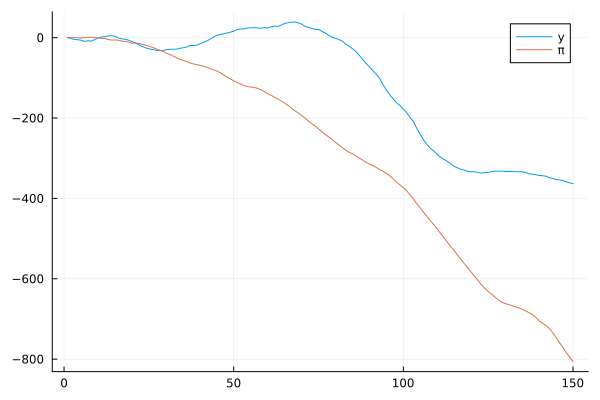

shape of obs = (150, 2)
shape of α = (150, 14)


In [4]:
n_obs = 150

#simulate data
obs, α = simulate_data(θ_true, cycle_order, n_obs)

# shape of obs
println("shape of obs = ", size(obs))
# shape of α
println("shape of α = ", size(α))

y = obs[:,1]
π = obs[:,2]

# plot data
plot(y, label="y")
plot!(π, label="π")
display(plot!())



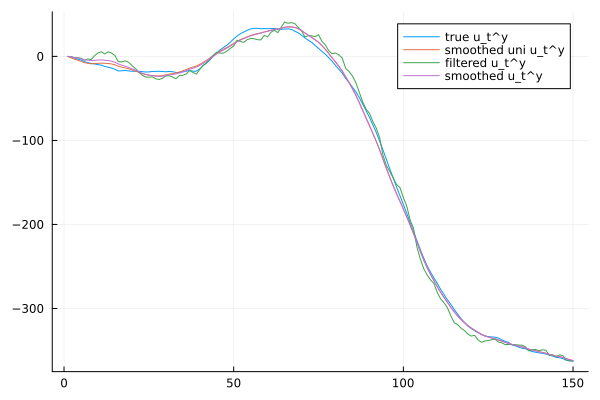

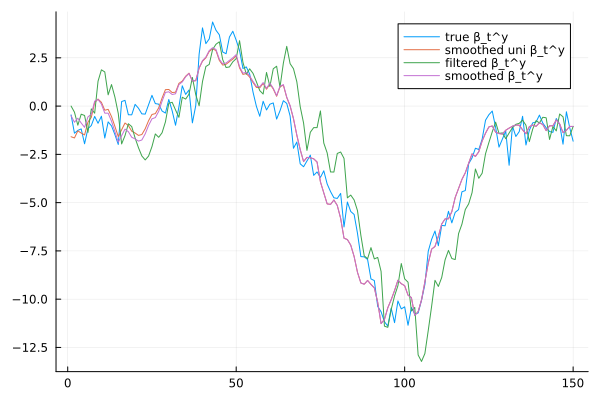

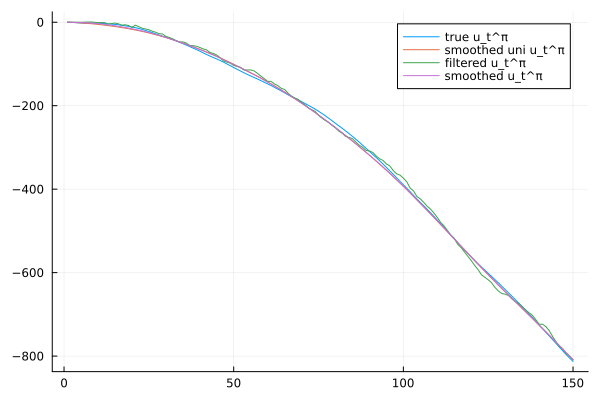

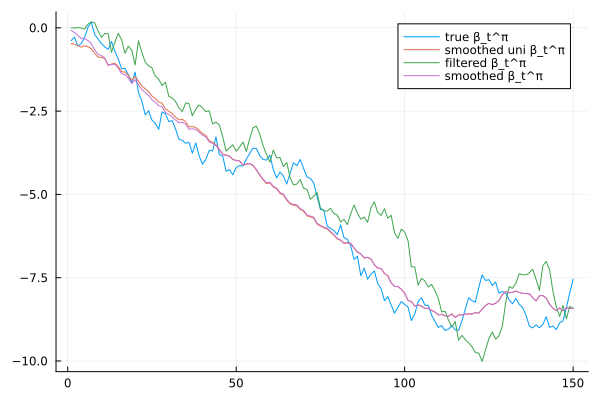

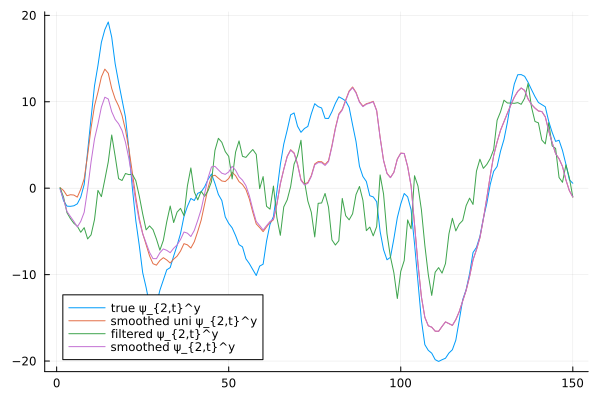

...

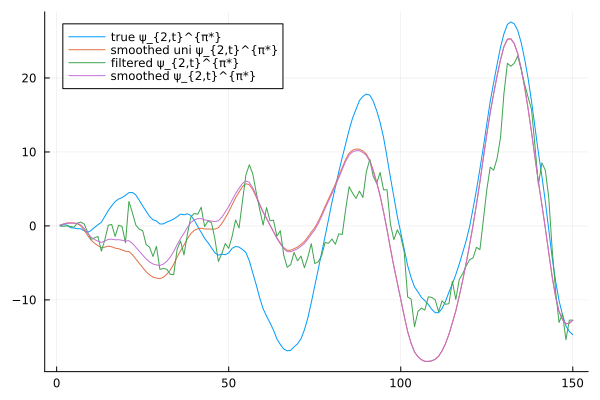

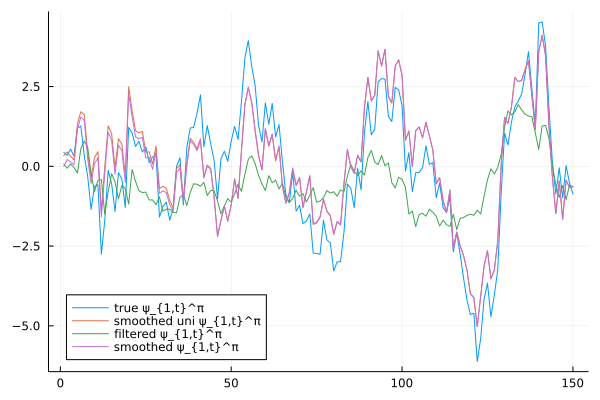

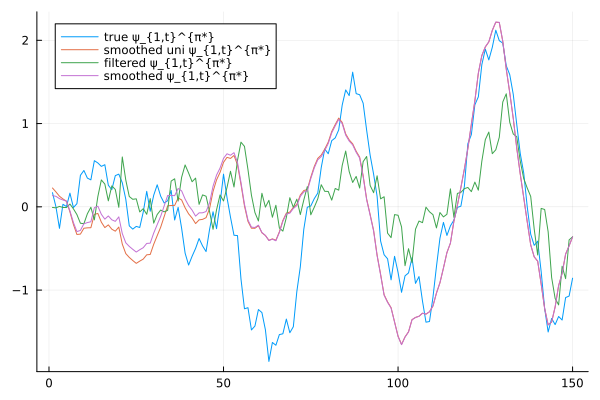

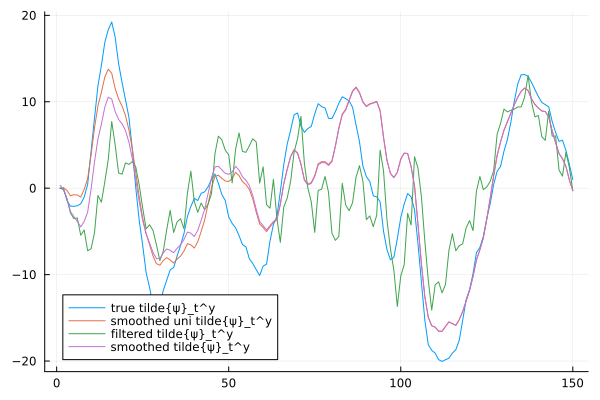

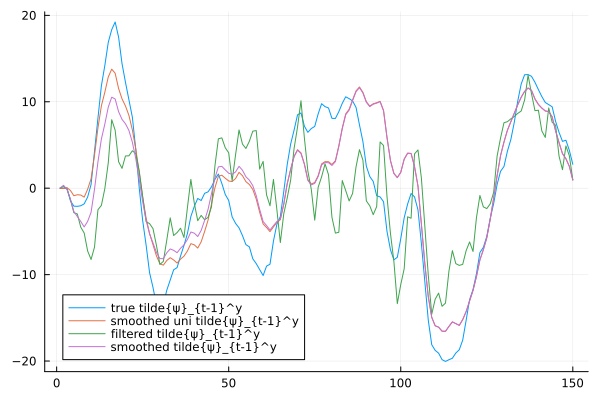

In [5]:
#Kalman filter 
α0 = zeros(size(T, 1))
P0 = Matrix(I, size(T, 1), size(T, 1))  # large initial uncertainty

LogL_diff, α_diff, P_diff = diffuse_kalman_filter(obs, θ_true, α0, P0, cycle_order, true, false)

LogL, α_f, P_f, α_p, P_p = kalman_filter(obs, θ_true, α0, P0, cycle_order)

α_s, P_s = kalman_smoother(θ_true, cycle_order, α_f, P_f, α_p, P_p)





for i in 1:size(α,2)
    plot(α[:,i], label="true $(α_elements[i])")
    plot!(α_diff[:,i], label="smoothed uni $(α_elements[i])")
    plot!(α_f[:,i], label="filtered $(α_elements[i])")
    plot!(α_s[:,i], label="smoothed $(α_elements[i])")
    display(plot!())
end






## MCMC

In [6]:
θ_draws, Γ_draws, Σ_Γ, accept_rate = mcmc_initialization(obs, prior_distributions, prior_hyperparameters, support, 2, 20000, 10000, 0.5)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:22


([0.5 0.5 … 0.5 0.5; 0.5 0.5 … 0.5 0.5; … ; 5.7738951330253615e-55 0.9999939991947203 … 0.9999999999622138 0.7574619612036118; 9.209940468495191e-55 0.9999915216097427 … 0.9999999998646667 0.7111698199116518], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; -124.88883319552511 12.023610883633081 … 23.99907720002936 1.1388147607976224; -124.42189672821607 11.677981475899841 … 22.72328011744293 0.9010723446047709], [440.53322831230275 347.6555979141389 … 73.55665002893839 -1.6312842862448278; 347.6555979141389 638.6492077433462 … -18.9229353588611 -0.2090563540093148; … ; 73.55665002893839 -18.9229353588611 … 80.82995412512788 -1.8430427939872671; -1.6312842862448278 -0.2090563540093148 … -1.8430427939872671 3.2717537177486595], 0.51635)

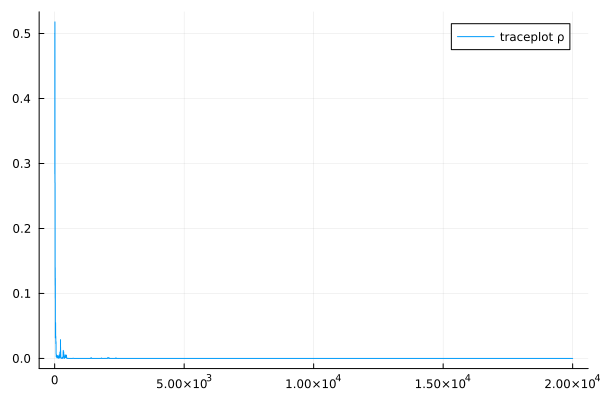

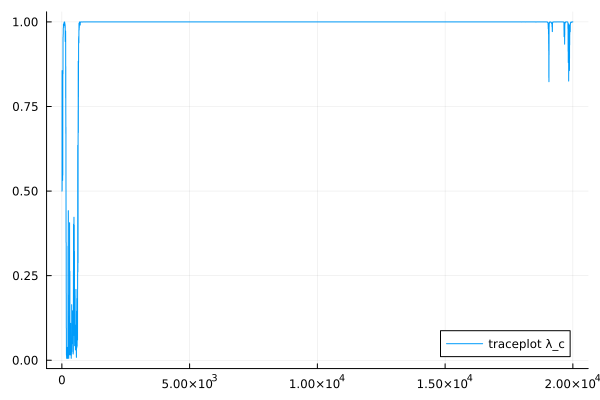

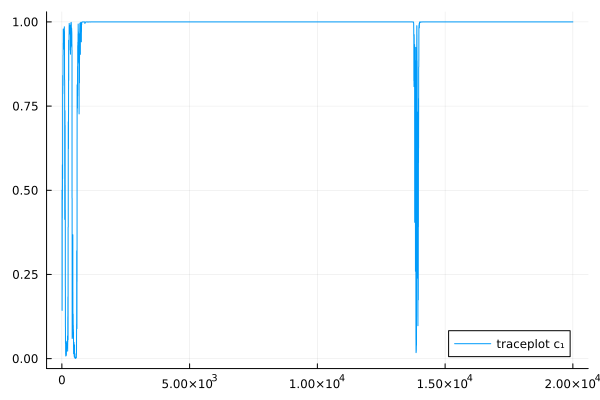

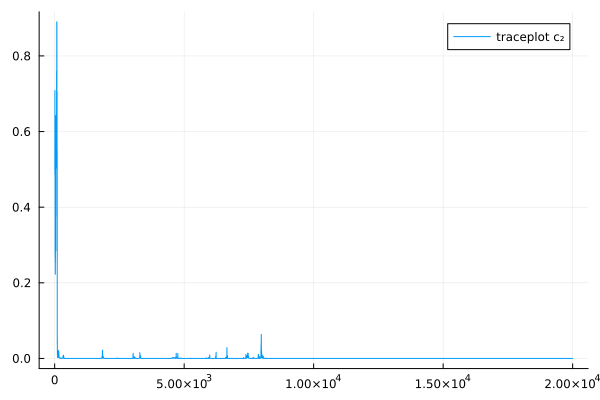

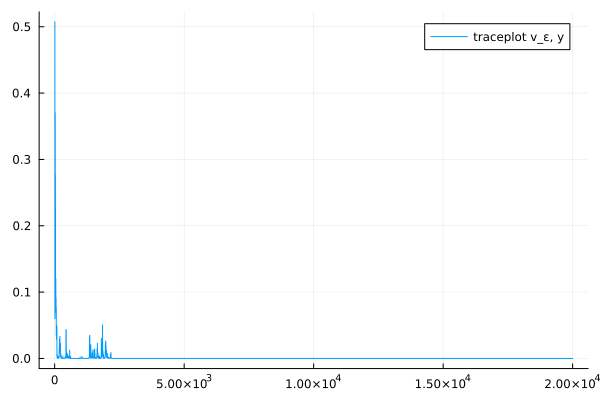

...

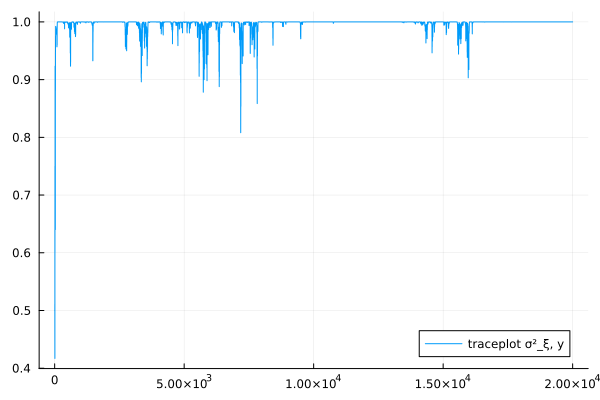

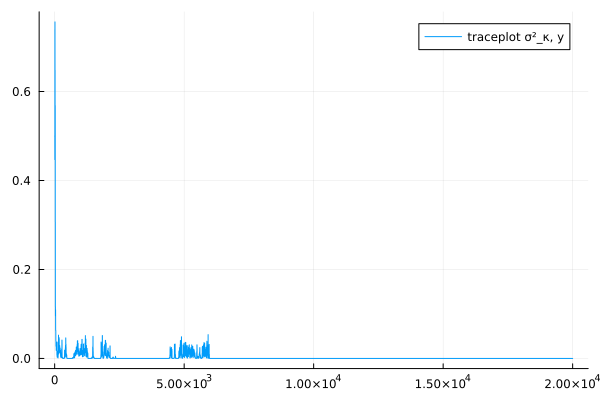

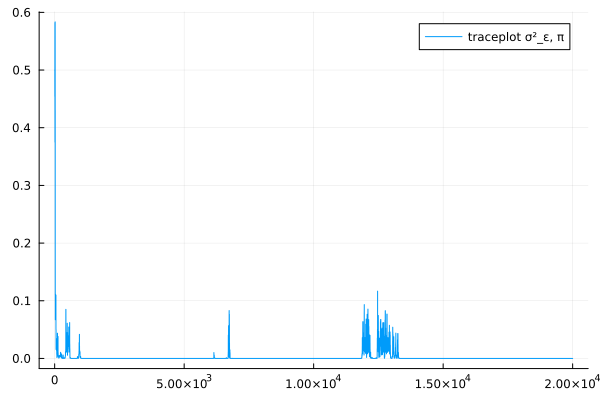

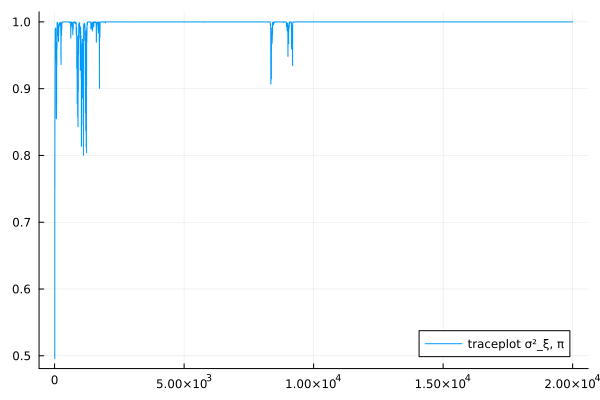

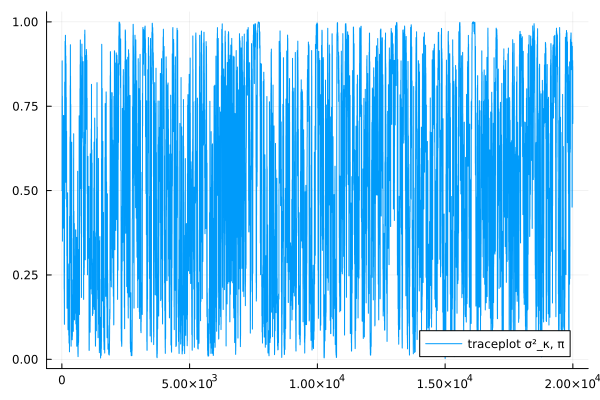

accept_rate = 0.51635


In [7]:
println("accept_rate = ", accept_rate)

#traceplots
for i in 1:n_params
    plot(θ_draws[:,i], label="traceplot $(θ_elements[i])")
    display(plot!())
end
